# Fundamental of Simulation Methods
**Name**: Maximilian Richter

**Matrikel Number**: 3463789

**Student ID**: hy455

## Problem Set 8: Numercial Hydrodynamics - Part I
### 8.1 Advection in 1D
$$\frac{\partial q(x,t)}{\partial t}+v\frac{\partial q(x,t)}{\partial x}=0$$

Text(0, 0.5, 'Value q(x,t=0)')

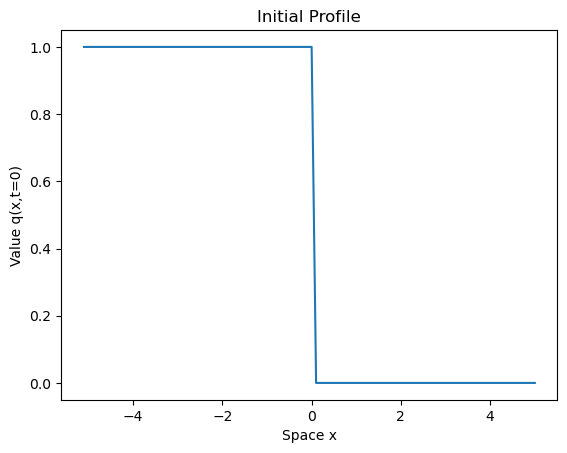

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cmasher
#plt.style.use("seaborn")
N = 100
L = 10
dx = L/N
x = np.arange(-L/2-dx,L/2+dx, dx)

v = 1

def q_init(x):
    q0 = np.zeros(x.shape)
    q0[np.where(x < 0)] = 1
    return q0

q0 = q_init(x)
plt.plot(x, q0)
plt.title("Initial Profile")
plt.xlabel("Space x")
plt.ylabel("Value q(x,t=0)")

### 1. Numerical Integration using **Symmetric** derivative

In [2]:
t0 = 0
t1 = 3
nt = 100
timesteps = np.linspace(0,3,100)
dt = timesteps[1] - timesteps[0]

solution = []
for t in timesteps:
    q0 = q0 - v * dt/(2*dx)*(np.roll(q0, -1) - np.roll(q0, 1))
    q0[0] = 1
    q0[-1] = 0
    solution.append(q0)

Text(0, 0.5, 'Time t')

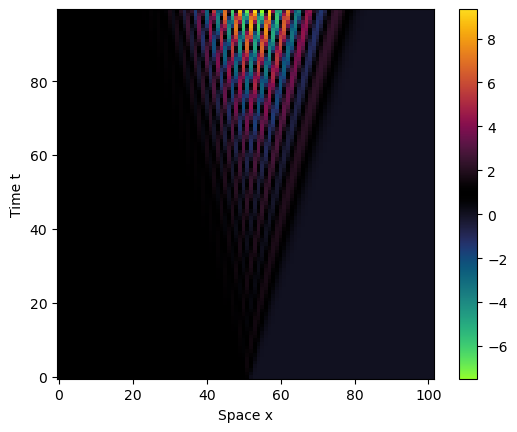

In [3]:
plt.imshow(solution, origin="lower", cmap="cmr.wildfire")
plt.colorbar()
plt.xlabel("Space x")
plt.ylabel("Time t")

In [4]:
from maxpy.makegif import make_gif

def plot(data, name):
    plt.clf()
    plt.plot(data)
    plt.savefig(name)
    
make_gif(plot, solution, "./central.gif")
#plt.plot(solution[2])

Save Images...


100%|██████████| 100/100 [00:02<00:00, 37.78it/s]


Done.
Make Gif...


100%|██████████| 100/100 [00:00<00:00, 138.34it/s]


Done.


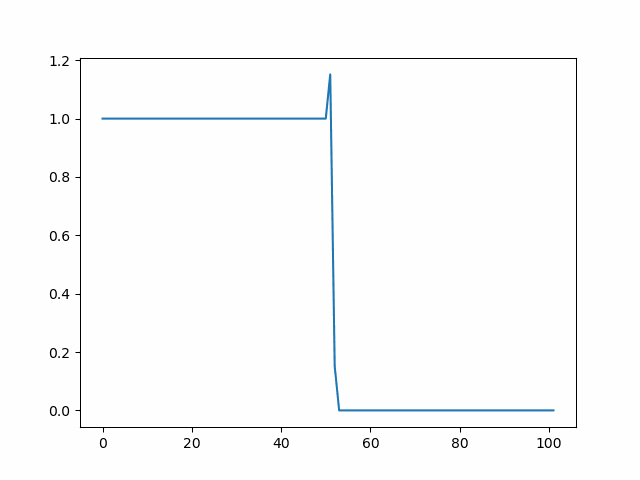

### 2. Upwind Scheme

Save Images...


100%|██████████| 100/100 [00:02<00:00, 36.89it/s]


Done.
Make Gif...


100%|██████████| 100/100 [00:00<00:00, 172.00it/s]


Done.


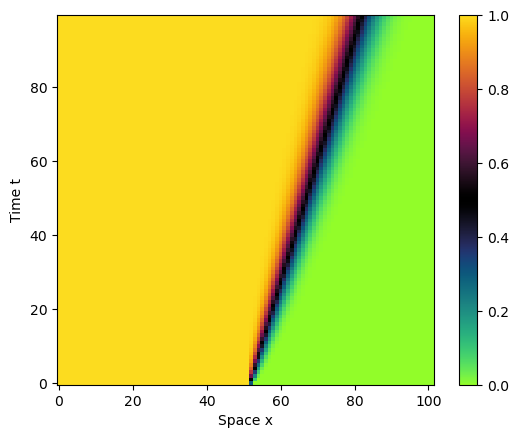

In [5]:
q0 = q_init(x)

solution = []
for t in timesteps:
    q0 = q0 - v * dt/(dx)*(q0 - np.roll(q0, 1)) # q[i] - q[i-1]
    q0[0] = 1
    q0[-1] = 0
    solution.append(q0)

plt.imshow(solution, origin="lower", cmap="cmr.wildfire")
plt.colorbar()
plt.xlabel("Space x")
plt.ylabel("Time t")

make_gif(plot, solution, "./upwind.gif")

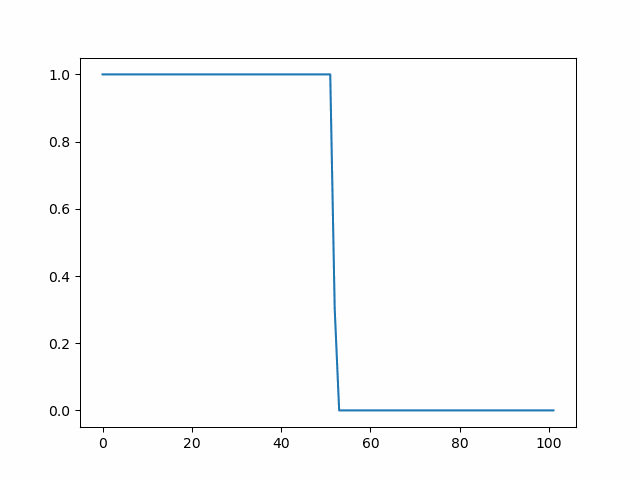

### 3. Downwind

Save Images...


  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:02<00:00, 41.53it/s]


Done.
Make Gif...


100%|██████████| 100/100 [00:00<00:00, 174.83it/s]


Done.


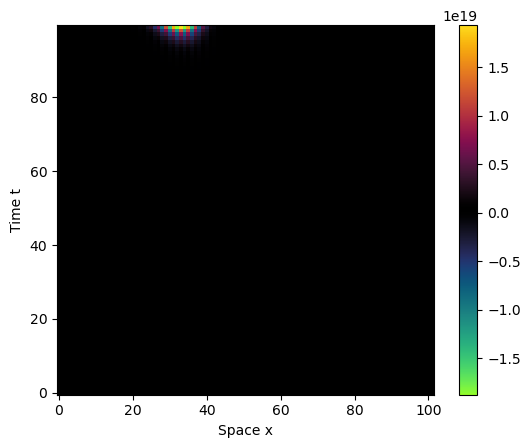

In [6]:
q0 = q_init(x)

solution = []
for t in timesteps:
    q0 = q0 - v * dt/(dx)*(np.roll(q0, -1) - q0)
    q0[0] = 1
    q0[-1] = 0
    solution.append(q0)

plt.imshow(solution, origin="lower", cmap="cmr.wildfire")
plt.colorbar()
plt.xlabel("Space x")
plt.ylabel("Time t")

make_gif(plot, solution, "./downwind.gif")

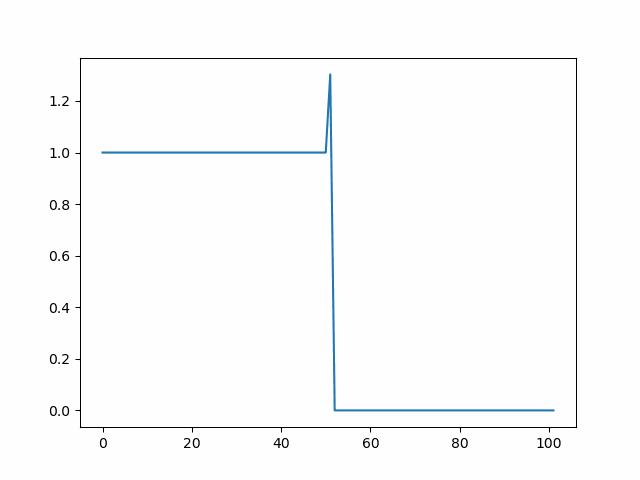

### 4. Left boundary condition to $q(-L/2,t)=0.5$

Save Images...


  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:02<00:00, 41.24it/s]


Done.
Make Gif...


100%|██████████| 100/100 [00:00<00:00, 159.18it/s]


Done.


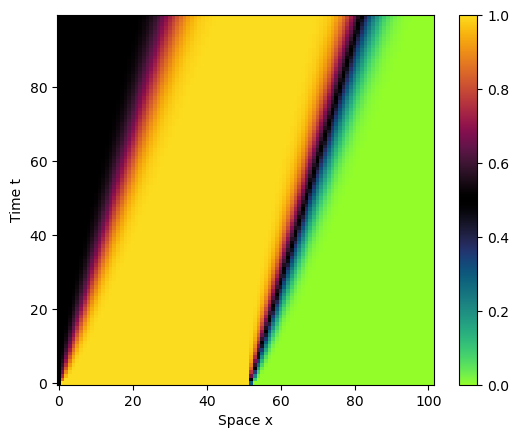

In [7]:
q0 = q_init(x)

solution = []
for t in timesteps:
    q0 = q0 - v * dt/(dx)*(q0 - np.roll(q0, 1))
    q0[0] = 0.5
    q0[-1] = 0
    solution.append(q0)

plt.imshow(solution, origin="lower", cmap="cmr.wildfire")
plt.colorbar()
plt.xlabel("Space x")
plt.ylabel("Time t")

make_gif(plot, solution, "./boundary-1.gif")

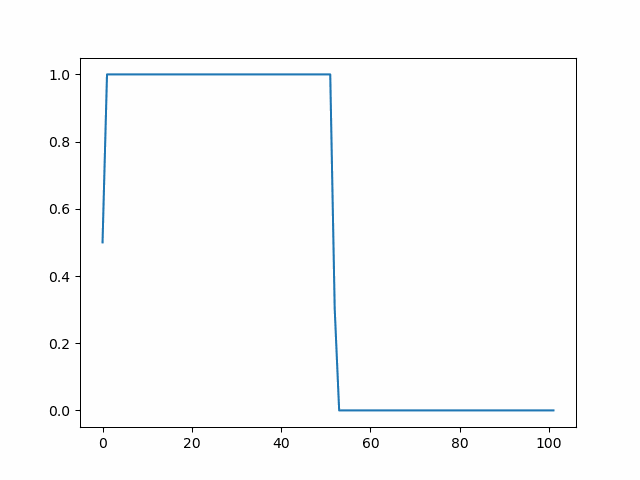

The new boundary value can propagate according to upwind from left to right

### 5. Right boundary condition to $q(+L/2,t)=0.5$

Save Images...


  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:02<00:00, 43.66it/s]


Done.
Make Gif...


100%|██████████| 100/100 [00:00<00:00, 176.30it/s]


Done.


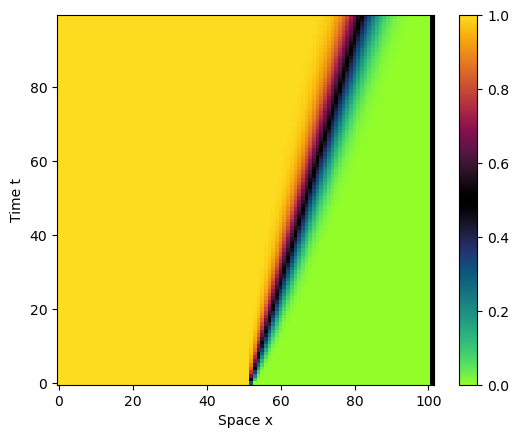

In [8]:
q0 = q_init(x)

solution = []
for t in timesteps:
    q0 = q0 - v * dt/(dx)*(q0 - np.roll(q0, 1))
    q0[0] = 1
    q0[-1] = 0.5
    solution.append(q0)

plt.imshow(solution, origin="lower", cmap="cmr.wildfire")
plt.colorbar()
plt.xlabel("Space x")
plt.ylabel("Time t")

make_gif(plot, solution, "./boundary-2.gif")

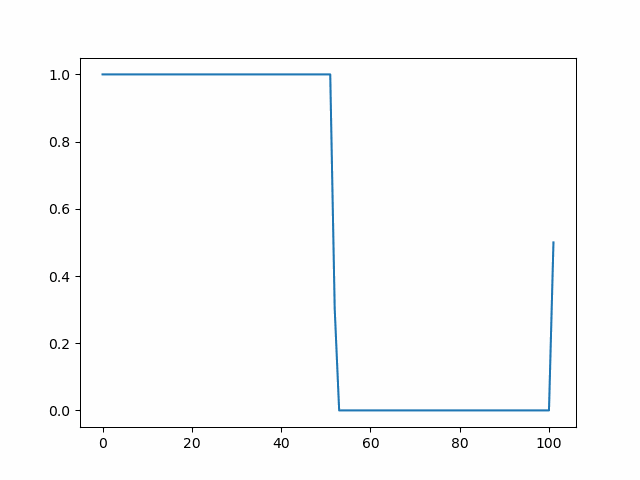

The information on the right side can not propagate any further because the upwind scheme takes information from left to right. With periodic boundary conditions it could also travel but would reappear on the left side.

### 6. Smaller Step Size

Save Images...


  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 1000/1000 [00:56<00:00, 17.59it/s]


Done.
Make Gif...


100%|██████████| 1000/1000 [00:06<00:00, 159.78it/s]


Done.


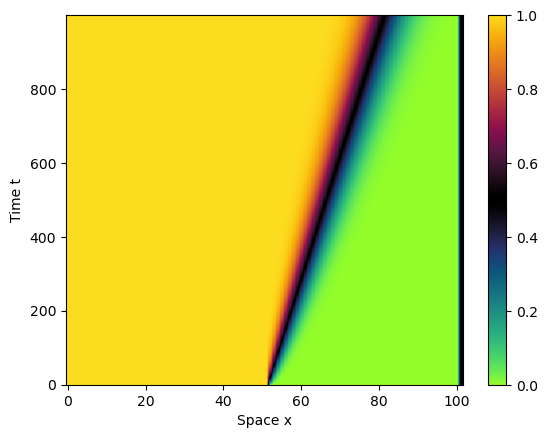

In [9]:
q0 = q_init(x)

t0 = 0
t1 = 3
nt = 1000
timesteps = np.linspace(t0, t1, nt)
dt = timesteps[1] - timesteps[0]

solution = []
for t in timesteps:
    q0 = q0 - v * dt/(dx)*(q0 - np.roll(q0, 1))
    q0[0] = 1
    q0[-1] = 0.5
    solution.append(q0)

plt.imshow(solution, origin="lower", aspect="auto", cmap="cmr.wildfire")
plt.colorbar()
plt.xlabel("Space x")
plt.ylabel("Time t")

make_gif(plot, solution, "./boundary-3.gif")

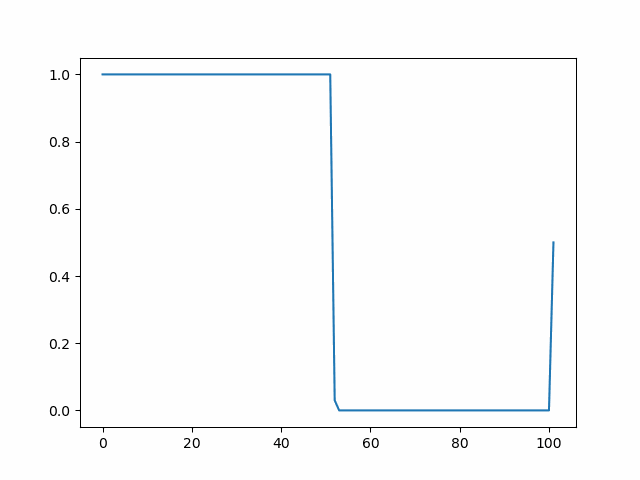

It stays more or less exactly the same as before. Even with higher resolution, the information can not travel from right to left with the upwind scheme and positive velocities

Save Images...


100%|██████████| 10/10 [00:00<00:00, 4153.60it/s]


Done.
Make Gif...


100%|██████████| 10/10 [00:00<00:00, 169.19it/s]

Done.


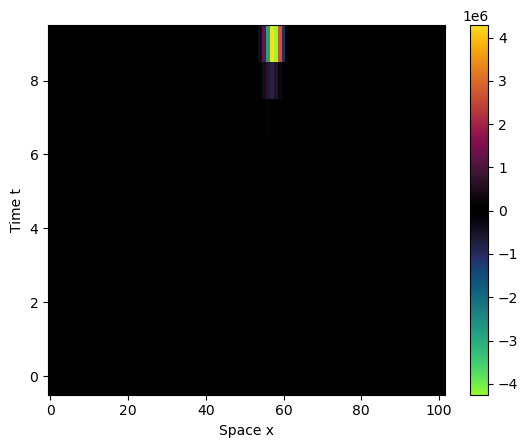

In [10]:
q0 = q_init(x)

t0 = 0
t1 = 3
nt = 10
timesteps = np.linspace(t0, t1, nt)
dt = timesteps[1] - timesteps[0]

solution = []
for t in timesteps:
    q0 = q0 - v * dt/(dx)*(q0 - np.roll(q0, 1))
    q0[0] = 1
    q0[-1] = 0.5
    solution.append(q0)

plt.imshow(solution, origin="lower", aspect="auto", cmap="cmr.wildfire")
plt.colorbar()
plt.xlabel("Space x")
plt.ylabel("Time t")

make_gif(plot, solution, "./boundary-4.gif")

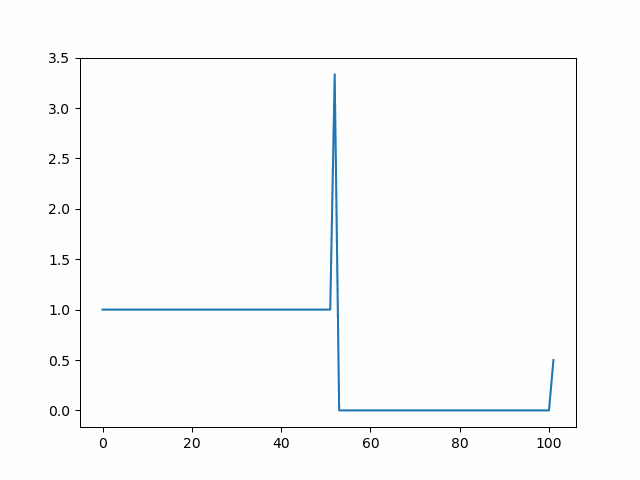

Now the step size is too large. Too large means that the information travels more than one cell per time step, which leads to instability. This can be avoided by considering the CFL limit on the time stepping.

## 8.2 General-purpose 1D Advection Function

In [2]:
def advect(qold, vold, dx, dt):
    """General purpose 1D advection function. 
    Vectorized with numpy arrays.

    Parameters
    ----------
    qold : Old value profile
        Old value profile
    vold : np.array
        Old velocity profile
    dx : float
        Spatial resolution
    dt : float
        temporal resolution

    Returns
    -------
    np.array
        New value profile one time step later
    """
    qnew = np.zeros(qold.shape)

    # Find positive/negative velocities to decide upwind/downwind
    v_mask = np.argwhere(vold > 0)
    v_mask_not = np.argwhere(vold <= 0)

    # Upwind
    qnew[v_mask] = qold[v_mask] - vold[v_mask]*dt/dx*(qold - np.roll(qold, 1))[v_mask]
    # Downwind
    qnew[v_mask_not] = qold[v_mask_not] - vold[v_mask_not]*dt/dx*(np.roll(qold, -1) - qold)[v_mask_not]
    return qnew

### 8. Apply function to exercise 8.1

NameError: name 'make_gif' is not defined

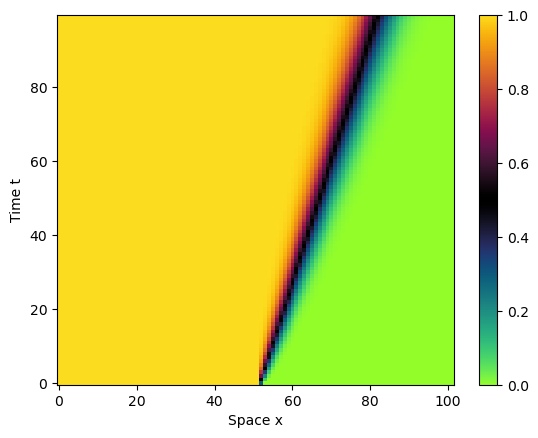

In [8]:
q0 = q_init(x)

t0 = 0
t1 = 3
nt = 100
timesteps = np.linspace(t0, t1, nt)
dt = timesteps[1] - timesteps[0]

v = np.ones(q0.shape)

solution = []
for t in timesteps:
    q0 = advect(q0, v, dx, dt)
    q0[0] = 1
    q0[-1] = 0
    solution.append(q0.copy())

plt.imshow(solution, origin="lower", aspect="auto", cmap="cmr.wildfire")
plt.colorbar()
plt.xlabel("Space x")
plt.ylabel("Time t")

make_gif(plot, solution, "./general-advection-1.gif")

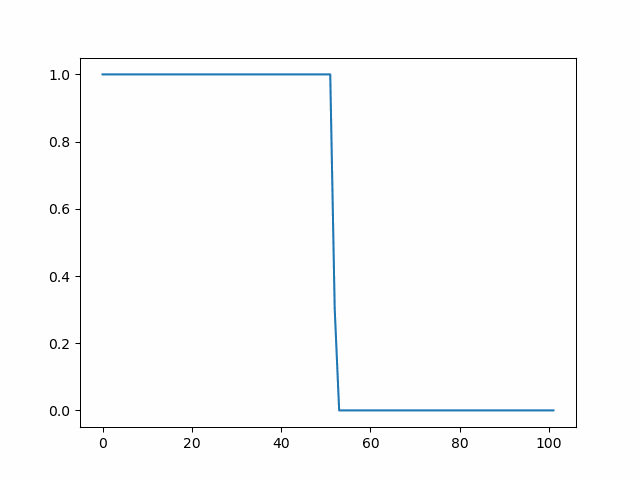

### 9. Converging velocity field

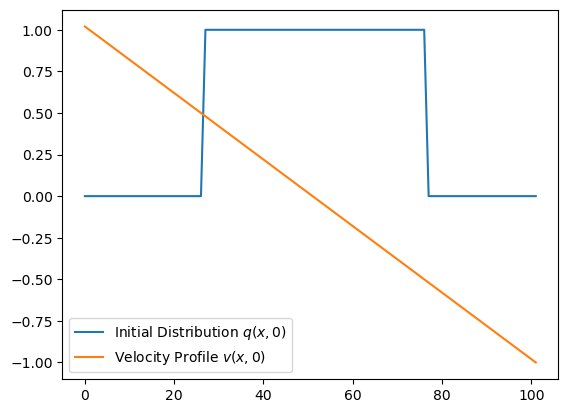

In [24]:
q0 = np.zeros(x.shape)
q0[np.where(np.abs(x) <= L/4)] = 1

v = -2*x/L

plt.plot(q0, label="Initial Distribution $q(x,0)$")
plt.plot(v, label="Velocity Profile $v(x,0)$")
plt.legend()

Text(0, 0.5, 'Time t')

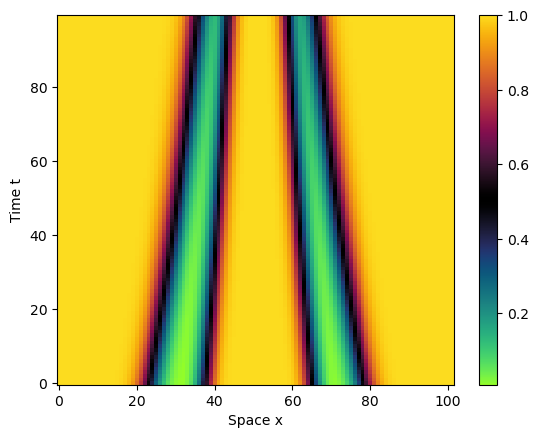

In [26]:
solution = []
for t in timesteps:
    q0 = advect(q0, v, dx, dt)
    #v = -np.gradient(v, dx)
    #q0[0] = 1
    #q0[-1] = 1
    solution.append(q0.copy())

plt.imshow(solution, origin="lower", aspect="auto", cmap="cmr.wildfire")
plt.colorbar()
plt.xlabel("Space x")
plt.ylabel("Time t")

#make_gif(plot, solution, "./general-advection-2.gif")

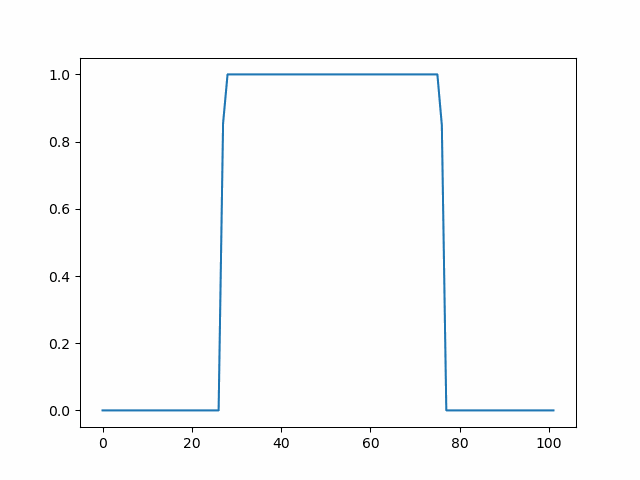

Now the box shaped initial profile gets shrinked into a smaller width by the converging velocity profile. This is because on the left the velocity is positive and on the right it is negative, so the right wave travels to the left and the left wave travels to the right.